<a href="https://colab.research.google.com/github/Kavin4240/Rainfall-Prediction/blob/main/Rainfall0_pred.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


***Installing libraries***

In [ ]:
!pip install ipyplot
!pip install Pillow
!pip install split-folders

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 29.5 MB/s eta 0:00:00


***Import Libraries***

In [ ]:
import os
import glob
import cv2
import splitfolders
import numpy as np
import shutil
import ipyplot
import PIL
from PIL import Image
import tensorflow as tf
from tensorflow.python.ops.numpy_ops import np_config
np_config.force_b64 = True
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import keras
import imgaug as ia
from imgaug import augmenters as iaa
from sklearn.metrics import classification_report,confusion_matrix

***Preprocessing Steps***

***1.Day/Night Discrimination***

In [ ]:
# def is_night(image_path, threshold=100):
#     image = cv2.imread(image_path)
#     gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
#     average_intensity = np.mean(gray_image)
#     return average_intensity < threshold
# data_dir = '/content/drive/MyDrive/R&D Project/img'
# day_images_dir = '/content/drive/MyDrive//R&D Project/img/day_img'
# night_images_dir = '/content/drive/MyDrive//R&D Project/img/night_img'
# threshold_value = 100
# os.makedirs(day_images_dir, exist_ok=True)
# os.makedirs(night_images_dir, exist_ok=True)
# for filename in os.listdir(data_dir):
#     image_path = os.path.join(data_dir, filename)
#     if os.path.isfile(image_path):
#         is_night_image = is_night(image_path, threshold=threshold_value)
#         if is_night_image:
#             save_path = os.path.join(night_images_dir, filename)
#         else:
#             save_path = os.path.join(day_images_dir, filename)
#         shutil.copy(image_path, save_path)
#     else:
#         print(f"Skipping '{image_path}' as it is not a file.")
# print("Image classification and relocation completed.")


In [ ]:
# def get_number_of_images(folder_path):
#   number_of_images = 0
#   for file in os.listdir(folder_path):
#     if file.endswith(".png"):
#       number_of_images += 1
#   return number_of_images
# if __name__ == "__main__":
#   number_of_images_in_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/img")
#   print("Number of images in images folder:", number_of_images_in_images_folder)
#   number_of_images_in_day_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/img/day_img")
#   print("Number of images in day_images folder:", number_of_images_in_day_images_folder)
#   number_of_images_in_night_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/img/night_img")
#   print("Number of images in night_images folder:", number_of_images_in_night_images_folder)
#   number_of_images_list = [number_of_images_in_images_folder, number_of_images_in_day_images_folder, number_of_images_in_night_images_folder]
#   colors = ['red', 'green', 'blue']
#   plt.bar(['Total', 'Day', 'Night'], number_of_images_list, color=colors)
#   plt.title('Number of Total,Day and Night Images')
#   plt.xlabel('Type of image')
#   plt.ylabel('Number of images')
#   plt.show()

***2.Image resizing***

***Rainfall Images***

In [ ]:
TARGET_SIZE = (128, 128)
if not os.path.exists('/content/drive/MyDrive/R&D Project/images_2/rain'):
    os.makedirs('/content/drive/MyDrive/R&D Project/images_2/rain')
for filename in os.listdir('/content/drive/MyDrive/R&D Project/images_1/rain'):
    image_path = os.path.join('/content/drive/MyDrive/R&D Project/images_1/rain', filename)
    try:
        image = Image.open(image_path)
        resized_image = image.resize(TARGET_SIZE)
        output_path = os.path.join('/content/drive/MyDrive/R&D Project/images_2/rain', filename)
        resized_image.save(output_path)
    except Exception as e:
        print(f"Error processing {filename}: {str(e)}")
print('Image resizing complete!')


Image resizing complete!


***No Rainfall Images***

In [ ]:
TARGET_SIZE = (128, 128)
if not os.path.exists('/content/drive/MyDrive/R&D Project/images_2/no_rain'):
    os.makedirs('/content/drive/MyDrive/R&D Project/images_2/no_rain')
for filename in os.listdir('/content/drive/MyDrive/R&D Project/images_1/no_rain'):
    image_path = os.path.join('/content/drive/MyDrive/R&D Project/images_1/no_rain', filename)
    image = Image.open(image_path)
    resized_image = image.resize(TARGET_SIZE)
    output_path = os.path.join('/content/drive/MyDrive/R&D Project/images_2/no_rain', filename)
    resized_image.save(output_path)
print('Image resizing complete!')


Image resizing complete!


***3.Image augmentation***

***Rainfall Images***


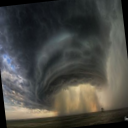
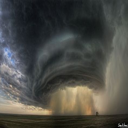
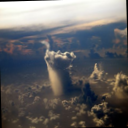
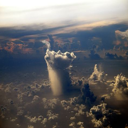
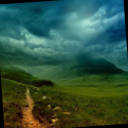
...
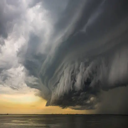
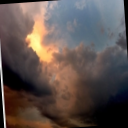
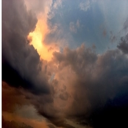
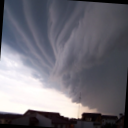
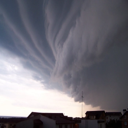

In [ ]:
image_directory = '/content/drive/MyDrive/R&D Project/images_2/rain/'
image_files = os.listdir(image_directory)
image_paths = [os.path.join(image_directory, filename) for filename in image_files]
rotate = iaa.Affine(rotate=(-15, 15))
augmented_images = []
labels = []
for image_path in image_paths:
    input_img = Image.open(image_path)
    input_img_rgb = input_img.convert('RGB')
    input_img_array = np.array(input_img_rgb)
    input_aug_rotate = rotate.augment_image(input_img_array)
    augmented_images.append(input_aug_rotate)
    labels.append('Rotated')
    augmented_images = [ia.imresize_single_image(image, (input_img_array.shape[1], input_img_array.shape[0])) for image in augmented_images]
    augmented_images.append(input_img_array)
    labels.append('Original')
for i, image in enumerate(augmented_images):
    PIL.Image.fromarray(image).save(f'/content/drive/MyDrive/R&D Project/augmented_images/rain/aug_{i}.png')
ipyplot.plot_images(augmented_images, labels=labels, img_width=125)


***No Rainfall Images***

In [ ]:
image_directory = '/content/drive/MyDrive/R&D Project/images_2/no_rain/'
image_files = os.listdir(image_directory)
image_paths = [os.path.join(image_directory, filename) for filename in image_files]
rotate = iaa.Affine(rotate=(-15, 15))
augmented_images = []
labels = []
for image_path in image_paths:
    input_img = Image.open(image_path)
    input_img_array = np.array(input_img)
    input_aug_rotate = rotate.augment_image(input_img_array)
    augmented_images.append(input_aug_rotate)
    labels.append('Rotated')
    augmented_images = [ia.imresize_single_image(image, (input_img_array.shape[1], input_img_array.shape[0])) for image in augmented_images]
    augmented_images.append(input_img_array)
    labels.append('Original')
for i, image in enumerate(augmented_images):
    PIL.Image.fromarray(image).save(f'/content/drive/MyDrive/R&D Project/augmented_images/no_rain/aug_{i}.png')
ipyplot.plot_images(augmented_images, labels=labels, img_width=125)


In [ ]:
def get_number_of_images(folder_path):
  number_of_images = 0
  for file in os.listdir(folder_path):
    if file.endswith(".png"):
      number_of_images += 1
  return number_of_images
if __name__ == "__main__":
  number_of_images_in_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/images_2/rain")
  print("Number of rainfall images:", number_of_images_in_rain_images_folder)
  number_of_images_in_no_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/images_2/no_rain")
  print("Number of no rainfall images:", number_of_images_in_no_rain_images_folder)
  number_of_images_list = [number_of_images_in_rain_images_folder, number_of_images_in_no_rain_images_folder ]
  colors = ['pink', 'orange']
  plt.bar(['Rain', 'No rain'], number_of_images_list, color=colors)
  plt.title('Number of  Images')
  plt.xlabel('Type of image')
  plt.ylabel('Number of images')
  plt.show()

***Count of rain and no rain images before and after augmentation***

In [ ]:
def get_number_of_images(folder_path):
  number_of_images = 0
  for file in os.listdir(folder_path):
    if file.endswith(".png"):
      number_of_images += 1
  return number_of_images
if __name__ == "__main__":
  number_of_images_in_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/images_2/rain")
  print("Number of no augmented rainfall images:", number_of_images_in_rain_images_folder)
  number_of_images_in_no_rain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/images_2/no_rain")
  print("Number of no augmented no rainfall images:", number_of_images_in_no_rain_images_folder)
  number_of_images_in_augrain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/augmented_images/rain")
  print("Number of augmented rainfall images:", number_of_images_in_augrain_images_folder)
  number_of_images_in_augnorain_images_folder = get_number_of_images("/content/drive/MyDrive/R&D Project/augmented_images/no_rain")
  print("Number of augmented no rainfall images:",number_of_images_in_augnorain_images_folder)
  number_of_images_list = [number_of_images_in_rain_images_folder, number_of_images_in_no_rain_images_folder, number_of_images_in_augrain_images_folder, number_of_images_in_augnorain_images_folder ]
  colors = ['red', 'green', 'orange', 'blue']
  plt.bar(['Rain', 'No rain', 'Augmented Rain','Augmented No rain'], number_of_images_list, color=colors)
  plt.title('Number of Total,Day and Night Images')
  plt.xlabel('Type of image')
  plt.ylabel('Number of images')
  plt.show()

***Split folders***

In [ ]:
splitfolders.ratio('../content/drive/MyDrive/R&D Project/augmented_images/', output="output", seed=1345, ratio=(.8, 0.1,0.1))

Copying files: 2000 files [00:47, 41.98 files/s] 


***Train,Validation and Test***

In [ ]:
IMG_HEIGHT = 128
IMG_WIDTH = 128
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
"./output/train",
seed=123,
image_size=(IMG_HEIGHT, IMG_WIDTH),
batch_size=64
)
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
"./output/test",
seed=123,
image_size=(IMG_HEIGHT, IMG_WIDTH),
batch_size=64
)
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
"./output/val",
seed=123,
image_size=(IMG_HEIGHT, IMG_WIDTH),
batch_size=64
)

Found 1600 files belonging to 2 classes.
Found 200 files belonging to 2 classes.
Found 200 files belonging to 2 classes.


***Train Class name***

In [ ]:
class_names = train_ds.class_names
print(class_names)
train_ds

['no_rain', 'rain']


<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None,), dtype=tf.int32, name=None))>

***Sample Images before prediction***

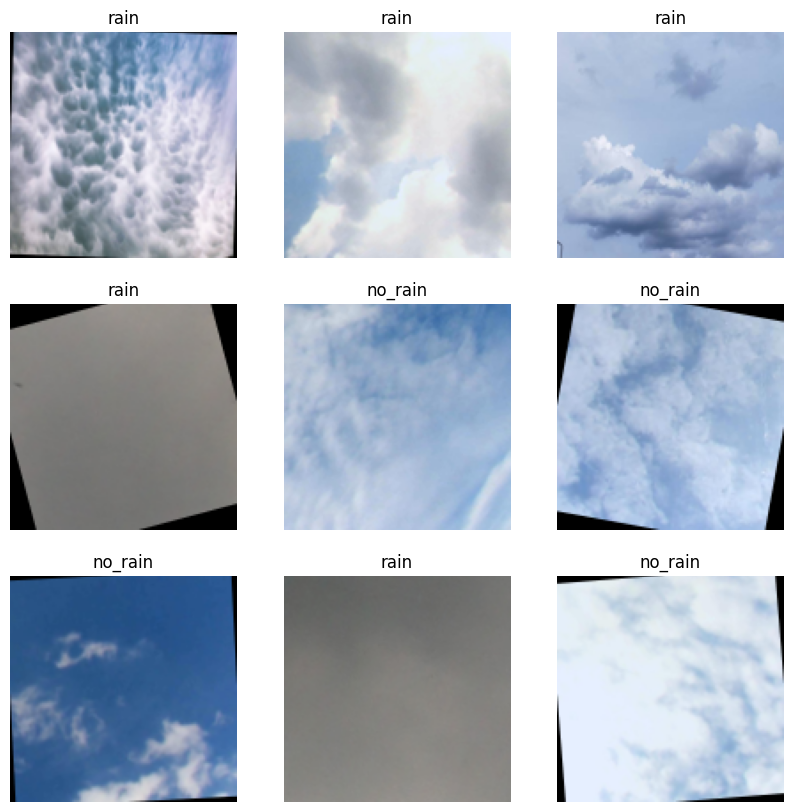

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")

***CNN-ADAM***

***Build model***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT,IMG_WIDTH, 3)))
model.add(keras.layers.Conv2D(filters=16,kernel_size=(3,3),padding='same',activation='relu',kernel_initializer="he_normal"))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))


model.add(keras.layers.Conv2D(filters=32,kernel_size=(3,3),padding='same',activation='relu',kernel_initializer="he_normal"))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Dropout(0.20))

model.add(keras.layers.Conv2D(filters=64,kernel_size=(3,3),padding='same',activation='relu',kernel_initializer="he_normal"))
model.add(keras.layers.MaxPooling2D(pool_size=(2,2)))

model.add(keras.layers.Dropout(0.25))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(128,activation="relu",kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64,"relu"))
model.add(keras.layers.Dense(6,"softmax"))

***Compile model***

In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 64, 64, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 dropout_3 (Dropout)         (None, 32, 32, 32)       

***Summary of layers used in CNN model***

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 conv2d_3 (Conv2D)           (None, 128, 128, 16)      448       
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 64, 64, 16)        0         
 g2D)                                                            
                                                                 
 conv2d_4 (Conv2D)           (None, 64, 64, 32)        4640      
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 32, 32, 32)        0         
 g2D)                                                            
                                                                 
 dropout_3 (Dropout)         (None, 32, 32, 32)       

***Train and Validate CNN model***

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 4s 59ms/step - loss: 1.2055 - accuracy: 0.6656 - val_loss: 0.7355 - val_accuracy: 0.6500
Epoch 2/30
25/25 [==============================] - 3s 87ms/step - loss: 0.3357 - accuracy: 0.8431 - val_loss: 0.6154 - val_accuracy: 0.6700
Epoch 3/30
25/25 [==============================] - 2s 57ms/step - loss: 0.2311 - accuracy: 0.8875 - val_loss: 0.5443 - val_accuracy: 0.7300
Epoch 4/30
25/25 [==============================] - 3s 90ms/step - loss: 0.1871 - accuracy: 0.9100 - val_loss: 0.4143 - val_accuracy: 0.7750
Epoch 5/30
25/25 [==============================] - 3s 93ms/step - loss: 0.1753 - accuracy: 0.9200 - val_loss: 0.3933 - val_accuracy: 0.7800
Epoch 6/30
25/25 [==============================] - 3s 86ms/step - loss: 0.2201 - accuracy: 0.8950 - val_loss: 0.2749 - val_accuracy: 0.9050
Epoch 7/30
25/25 [==============================] - 2s 54ms/step - loss: 0.1480 - accuracy: 0.9269 - val_loss: 0.2476 - val_accuracy: 0.8900
Epoch 8/30
25

In [ ]:
get_ac1 = hist.history['accuracy']
get_los1 = hist.history['loss']
val_acc1 = hist.history['val_accuracy']
val_loss1 = hist.history['val_loss']

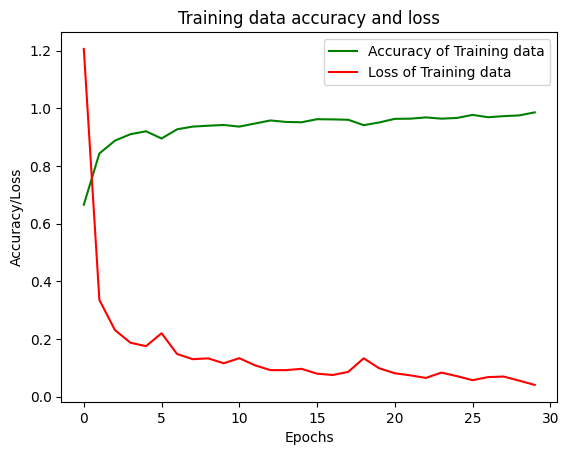

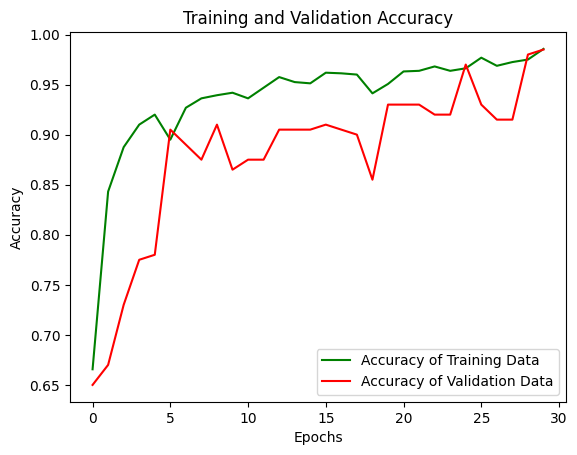

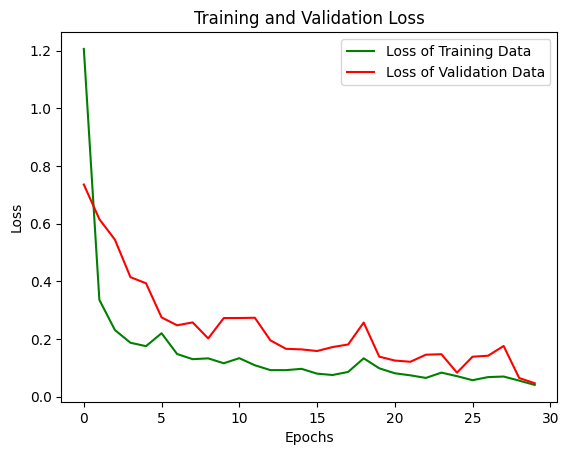

<Figure size 640x480 with 0 Axes>

In [ ]:
epochs = range(len(get_ac1))
plt.plot(epochs, get_ac1, 'g', label='Accuracy of Training data')
plt.plot(epochs, get_los1, 'r', label='Loss of Training data')
plt.title('Training data accuracy and loss')
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')

plt.legend(loc=0)
plt.figure()

plt.plot(epochs, get_ac1, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc1, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.figure()

plt.plot(epochs, get_los1, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss1, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.legend(loc=0)
plt.figure()
plt.show()

1/1 [==============================] - 0s 90ms/step


<ipython-input-70-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 20ms/step


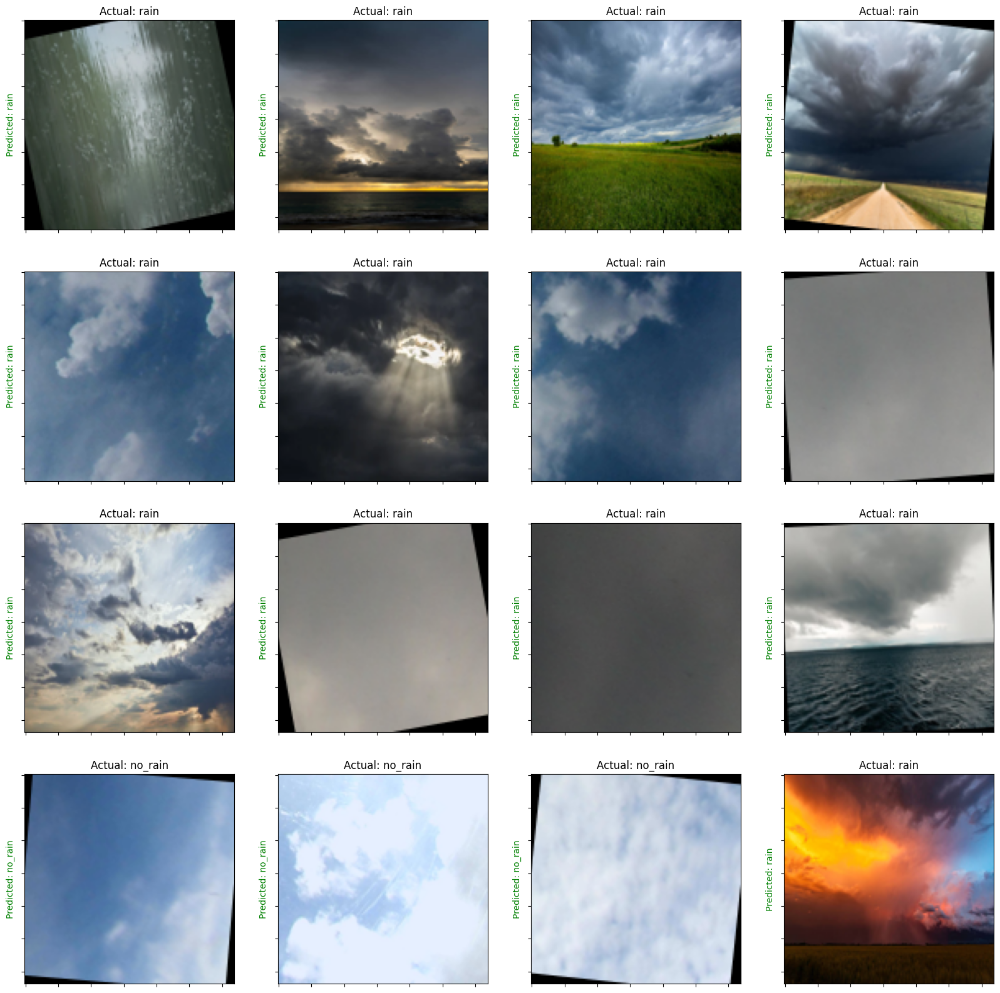

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 0 1 0 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1
 1 1 1 1 1 1 0 1 1 1 1 1 0 1 1 0 1 0 1 1 1 0 1 0 0 1 1], shape=(64,), dtype=int32) 64


In [ ]:
loss1,accuracy1 = model.evaluate(test_ds)
print(loss1,accuracy1)

4/4 [==============================] - 0s 15ms/step - loss: 0.0861 - accuracy: 0.9650
0.08614253997802734 0.9649999737739563


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 0s 9ms/step
              precision    recall  f1-score   support

           0       0.93      0.93      0.93        14
           1       0.98      0.98      0.98        50

    accuracy                           0.97        64
   macro avg       0.95      0.95      0.95        64
weighted avg       0.97      0.97      0.97        64



***RNN(LSTM)***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT,IMG_WIDTH, 3)))
model.add(keras.layers.Flatten())
model.add(keras.layers.Reshape((1, IMG_HEIGHT * IMG_WIDTH * 3)))
model.add(keras.layers.LSTM(64, input_shape=(1, IMG_HEIGHT * IMG_WIDTH * 3), return_sequences=True))
model.add(keras.layers.LSTM(32, return_sequences=True))
model.add(keras.layers.LSTM(16))
model.add(keras.layers.Dropout(0.25))
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, "relu"))
model.add(keras.layers.Dense(6, "softmax"))

In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_1 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 flatten_1 (Flatten)         (None, 49152)             0         
                                                                 
 reshape (Reshape)           (None, 1, 49152)          0         
                                                                 
 lstm (LSTM)                 (None, 1, 64)             12599552  
                                                                 
 lstm_1 (LSTM)               (None, 1, 32)             12416     
                                                                 
 lstm_2 (LSTM)               (None, 16)                3136      
                                                                 
 dropout_2 (Dropout)         (None, 16)               

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 10s 86ms/step - loss: 1.3695 - accuracy: 0.7088 - val_loss: 0.7896 - val_accuracy: 0.7500
Epoch 2/30
25/25 [==============================] - 2s 59ms/step - loss: 0.6457 - accuracy: 0.7500 - val_loss: 0.5730 - val_accuracy: 0.7500
Epoch 3/30
25/25 [==============================] - 3s 78ms/step - loss: 0.5714 - accuracy: 0.7500 - val_loss: 0.5643 - val_accuracy: 0.7500
Epoch 4/30
25/25 [==============================] - 1s 46ms/step - loss: 0.5676 - accuracy: 0.7500 - val_loss: 0.5642 - val_accuracy: 0.7500
Epoch 5/30
25/25 [==============================] - 2s 49ms/step - loss: 0.5672 - accuracy: 0.7500 - val_loss: 0.5652 - val_accuracy: 0.7500
Epoch 6/30
25/25 [==============================] - 2s 51ms/step - loss: 0.5715 - accuracy: 0.7500 - val_loss: 0.5650 - val_accuracy: 0.7500
Epoch 7/30
25/25 [==============================] - 1s 45ms/step - loss: 0.5645 - accuracy: 0.7500 - val_loss: 0.5649 - val_accuracy: 0.7500
Epoch 8/30
2

In [ ]:
get_ac2 = hist.history['accuracy']
get_los2 = hist.history['loss']
val_acc2 = hist.history['val_accuracy']
val_loss2 = hist.history['val_loss']

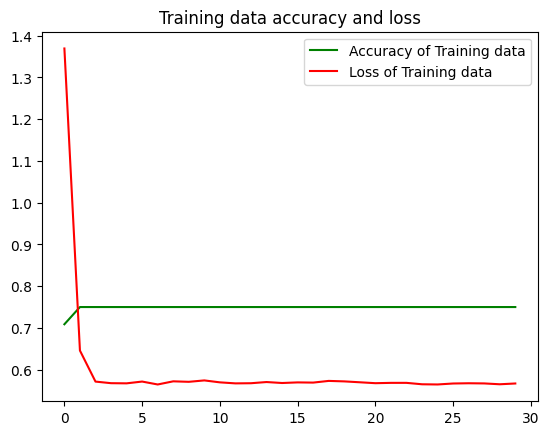

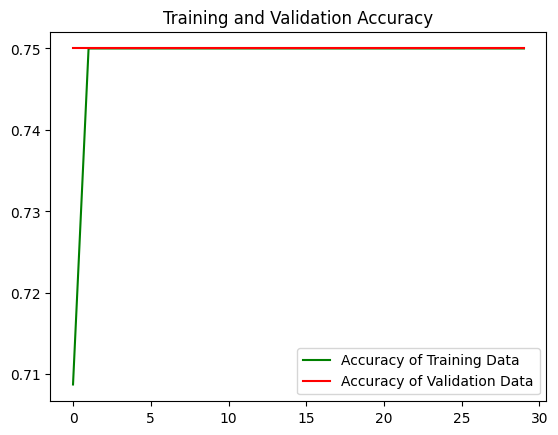

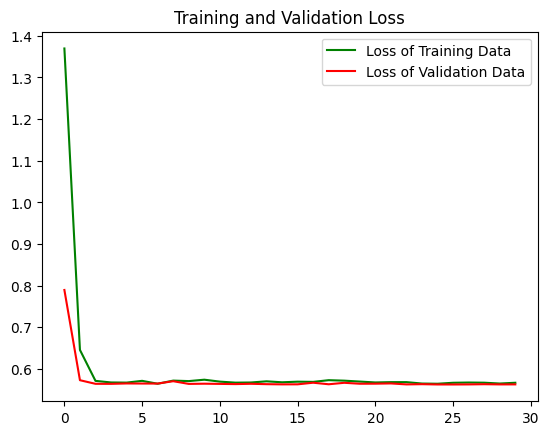

<Figure size 640x480 with 0 Axes>

In [ ]:

epochs = range(len(get_ac2))

# Plot accuracy and loss of training data
plt.plot(epochs, get_ac2, 'g', label='Accuracy of Training Data')
plt.plot(epochs, get_los2, 'r', label='Loss of Training Data')
plt.title('Training Data Accuracy and Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training accuracy and validation accuracy
plt.plot(epochs, get_ac2, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc2, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training loss and validation loss
plt.plot(epochs, get_los2, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss2, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

<ipython-input-27-4e9488dffff0>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 35ms/step


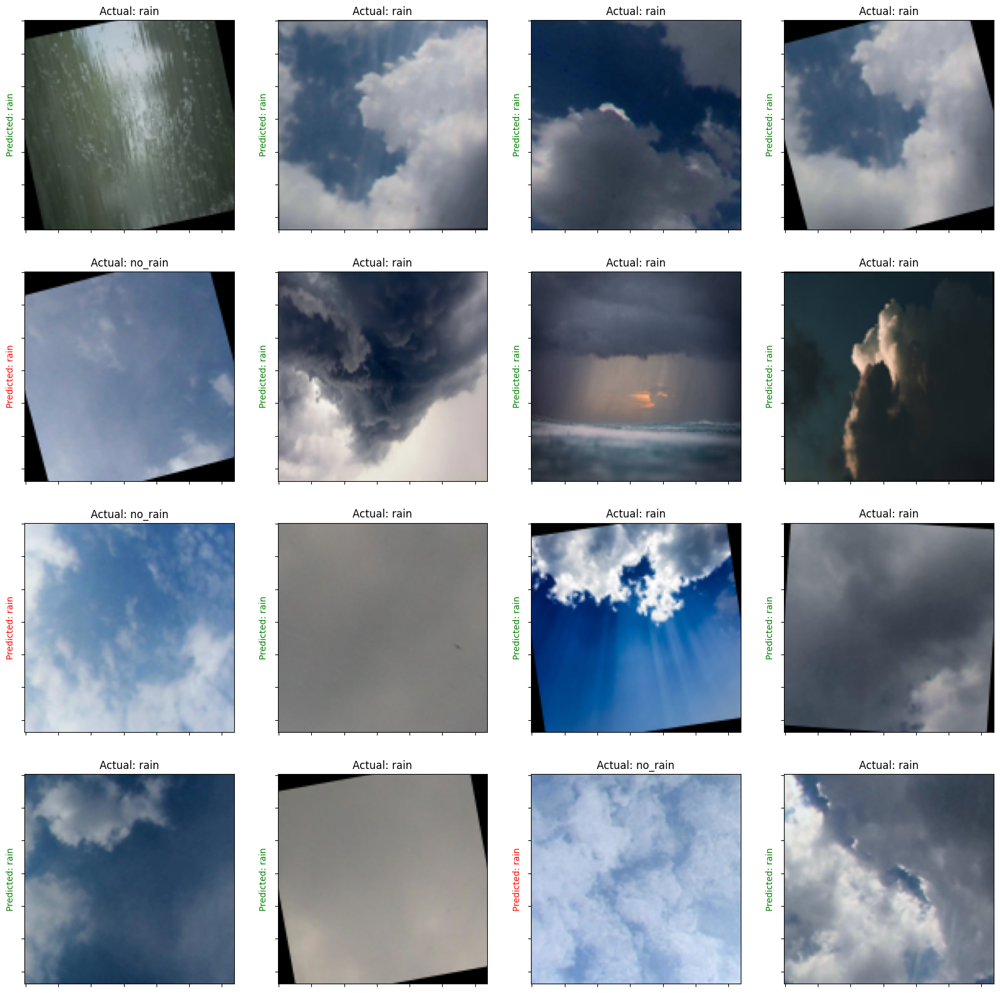

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})
        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 0 1 0 1 1 1 1 1 0 1 1 1 1 0 1 1 0 1 0 1 1 1 1 1 0 1 1 1 0 1 1 0 0 0 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 0 1 0 1 1 1 1 1 1 1 0 1], shape=(64,), dtype=int32) 64


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    a1=classification_report(label,pred)
    print(a1)

2/2 [==============================] - 0s 9ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        14
           1       0.78      1.00      0.88        50

    accuracy                           0.78        64
   macro avg       0.39      0.50      0.44        64
weighted avg       0.61      0.78      0.69        64



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
loss2, accuracy2 = model.evaluate(test_ds)
print(loss2,accuracy2)

4/4 [==============================] - 0s 11ms/step - loss: 0.5629 - accuracy: 0.7500
0.5629376173019409 0.75


***DNN-ADAM***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT,IMG_WIDTH, 3)))
# Replace convolutional layers with feedforward neural network layers
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(6, "softmax"))


In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_2 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 flatten_2 (Flatten)         (None, 49152)             0         
                                                                 
 dense_6 (Dense)             (None, 128)               6291584   
                                                                 
 dense_7 (Dense)             (None, 64)                8256      
                                                                 
 dense_8 (Dense)             (None, 6)                 390       
                                                                 
Total params: 6300230 (24.03 MB)
Trainable params: 6300230 (24.03 MB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 2s 42ms/step - loss: 12.5708 - accuracy: 0.6162 - val_loss: 3.1077 - val_accuracy: 0.7850
Epoch 2/30
25/25 [==============================] - 1s 44ms/step - loss: 2.5679 - accuracy: 0.7212 - val_loss: 3.4327 - val_accuracy: 0.4900
Epoch 3/30
25/25 [==============================] - 2s 72ms/step - loss: 1.4670 - accuracy: 0.7356 - val_loss: 1.2765 - val_accuracy: 0.6700
Epoch 4/30
25/25 [==============================] - 2s 58ms/step - loss: 1.1968 - accuracy: 0.7462 - val_loss: 1.4985 - val_accuracy: 0.5950
Epoch 5/30
25/25 [==============================] - 1s 39ms/step - loss: 0.6556 - accuracy: 0.7906 - val_loss: 0.7998 - val_accuracy: 0.7750
Epoch 6/30
25/25 [==============================] - 1s 47ms/step - loss: 1.0204 - accuracy: 0.7456 - val_loss: 1.4458 - val_accuracy: 0.7700
Epoch 7/30
25/25 [==============================] - 1s 41ms/step - loss: 0.9140 - accuracy: 0.7581 - val_loss: 0.6719 - val_accuracy: 0.7600
Epoch 8/30
2

In [ ]:
get_ac3 = hist.history['accuracy']
get_los3 = hist.history['loss']
val_acc3 = hist.history['val_accuracy']
val_loss3 = hist.history['val_loss']

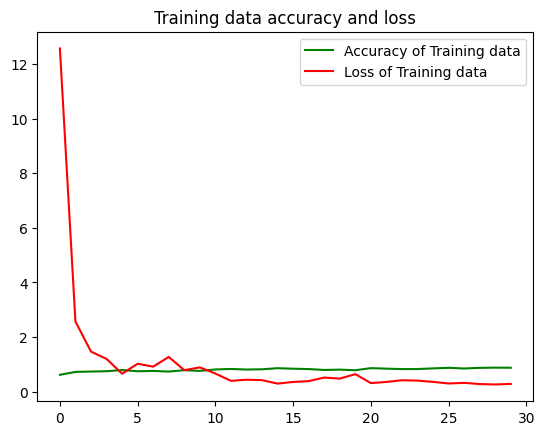

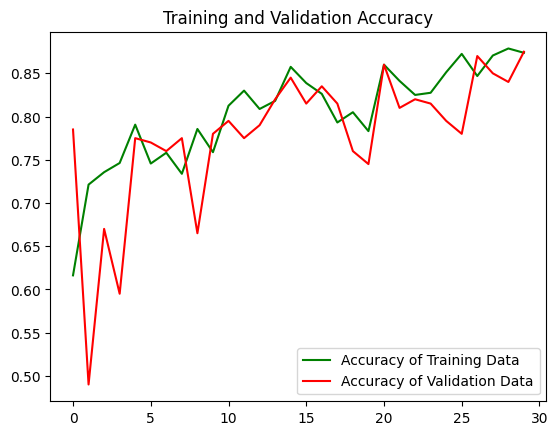

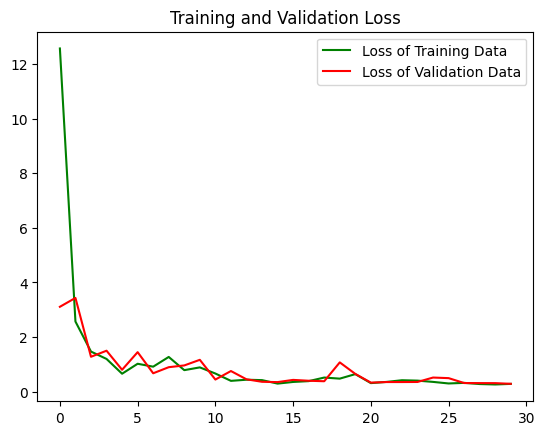

<Figure size 640x480 with 0 Axes>

In [ ]:

epochs = range(len(get_ac3))

# Plot accuracy and loss of training data
plt.plot(epochs, get_ac3, 'g', label='Accuracy of Training Data')
plt.plot(epochs, get_los3, 'r', label='Loss of Training Data')
plt.title('Training Data Accuracy and Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training accuracy and validation accuracy
plt.plot(epochs, get_ac3, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc3, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training loss and validation loss
plt.plot(epochs, get_los3, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss3, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

In [ ]:
loss3, accuracy3 = model.evaluate(test_ds)
print(loss3,accuracy3)

4/4 [==============================] - 0s 8ms/step - loss: 0.2842 - accuracy: 0.8550
0.28424718976020813 0.8550000190734863


1/1 [==============================] - 0s 58ms/step


<ipython-input-38-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 18ms/step


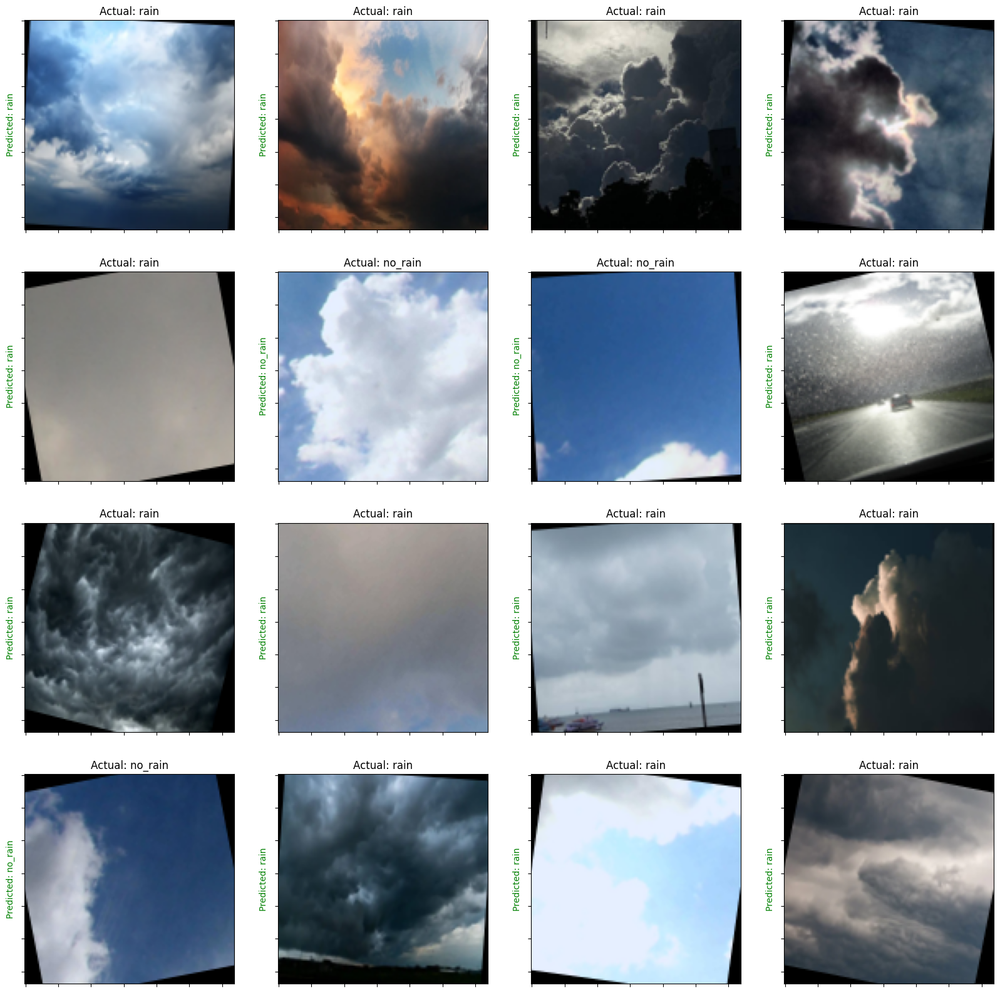

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 1 1 0 1 1 1 1 1 0
 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1 1 0 1 1 1 1 1], shape=(64,), dtype=int32) 64


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 0s 7ms/step
              precision    recall  f1-score   support

           0       0.75      0.86      0.80        14
           1       0.96      0.92      0.94        50

    accuracy                           0.91        64
   macro avg       0.85      0.89      0.87        64
weighted avg       0.91      0.91      0.91        64



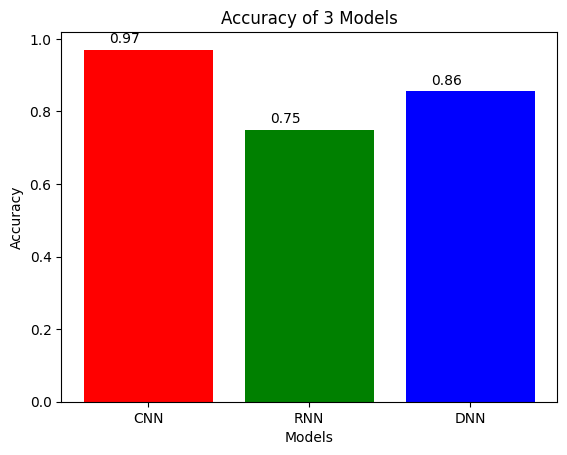

In [ ]:
accuracy_values = [accuracy1, accuracy2, accuracy3]
colors = ['red', 'green' ,'blue']
# Convert accuracy 5 to an integer
accuracy_values[-1] = float(accuracy_values[-1])
bar_chart = plt.bar(['CNN', 'RNN', 'DNN'], accuracy_values, color=colors)
for bar in bar_chart:
    y = bar.get_height()
    plt.text(bar.get_x() + 0.25, y + 0.01, f"{y:.4f}", ha='center', va='bottom')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy of 3 Models')
plt.show()

***RESNET-50***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.applications.ResNet50(include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.layers.GlobalAveragePooling2D())
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, "relu"))
model.add(keras.layers.Dense(6, "softmax"))

94765736/94765736 [==============================] - 5s 0us/step


In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_3 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 4, 4, 2048)        23587712  
                                                                 
 global_average_pooling2d (  (None, 2048)              0         
 GlobalAveragePooling2D)                                         
                                                                 
 dense_9 (Dense)             (None, 128)               262272    
                                                                 
 dense_10 (Dense)            (None, 64)                8256      
                                                                 
 dense_11 (Dense)            (None, 6)                 390       
                                                      

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 52s 321ms/step - loss: 0.3039 - accuracy: 0.9044 - val_loss: 17.4348 - val_accuracy: 0.7500
Epoch 2/30
25/25 [==============================] - 6s 225ms/step - loss: 0.0812 - accuracy: 0.9712 - val_loss: 30.9397 - val_accuracy: 0.7500
Epoch 3/30
25/25 [==============================] - 6s 228ms/step - loss: 0.0805 - accuracy: 0.9775 - val_loss: 4.5220 - val_accuracy: 0.7500
Epoch 4/30
25/25 [==============================] - 6s 239ms/step - loss: 0.1064 - accuracy: 0.9656 - val_loss: 7.7119 - val_accuracy: 0.7500
Epoch 5/30
25/25 [==============================] - 6s 228ms/step - loss: 0.0513 - accuracy: 0.9794 - val_loss: 29.9204 - val_accuracy: 0.7500
Epoch 6/30
25/25 [==============================] - 6s 229ms/step - loss: 0.0364 - accuracy: 0.9869 - val_loss: 19.2727 - val_accuracy: 0.7500
Epoch 7/30
25/25 [==============================] - 6s 237ms/step - loss: 0.0298 - accuracy: 0.9900 - val_loss: 0.9097 - val_accuracy: 0.7500
E

In [ ]:
get_ac4 = hist.history['accuracy']
get_los4 = hist.history['loss']
val_acc4 = hist.history['val_accuracy']
val_loss4 = hist.history['val_loss']

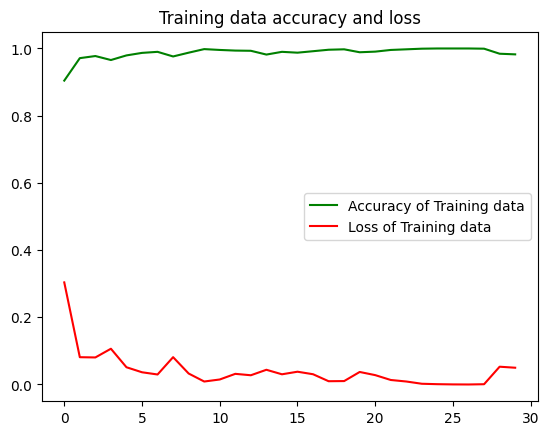

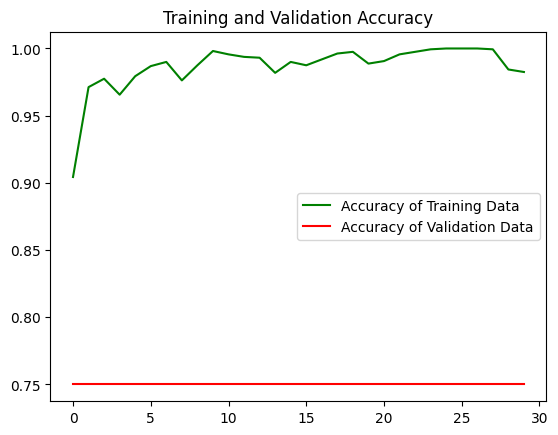

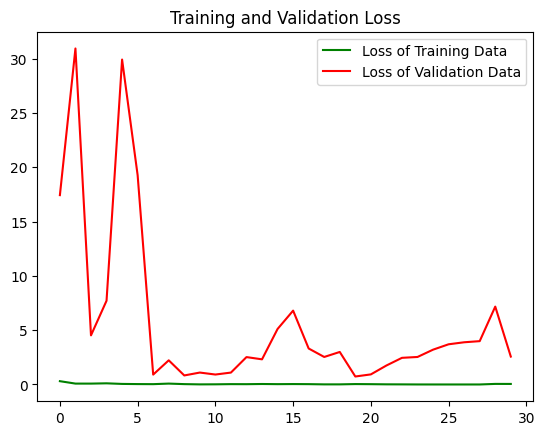

<Figure size 640x480 with 0 Axes>

In [ ]:
epochs = range(len(get_ac4))

# Plot accuracy and loss of training data
plt.plot(epochs, get_ac4, 'g', label='Accuracy of Training Data')
plt.plot(epochs, get_los4, 'r', label='Loss of Training Data')
plt.title('Training Data Accuracy and Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training accuracy and validation accuracy
plt.plot(epochs, get_ac4, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc4, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training loss and validation loss
plt.plot(epochs, get_los4, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss4, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

In [ ]:
loss4, accuracy4 = model.evaluate(test_ds)
print(loss4,accuracy4)

4/4 [==============================] - 0s 52ms/step - loss: 2.6738 - accuracy: 0.7500
2.673809289932251 0.75


<ipython-input-49-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 38ms/step


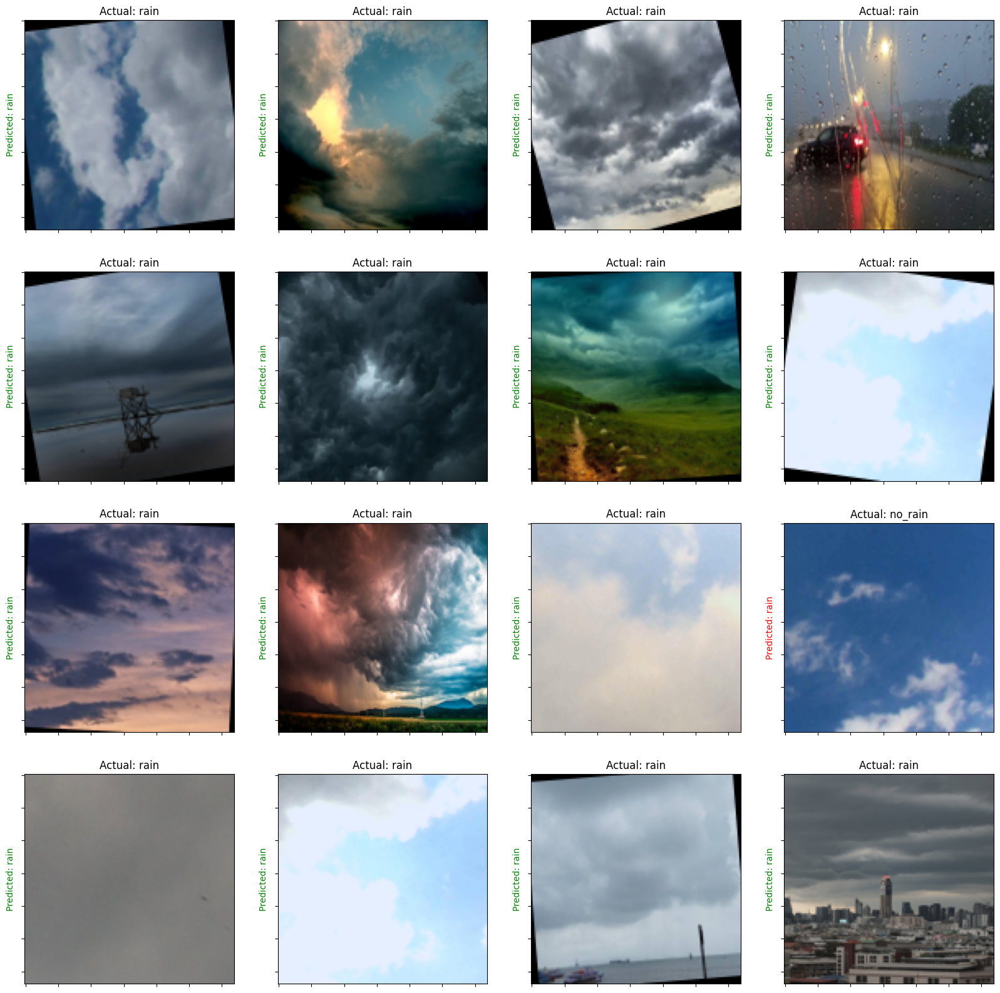

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 0 1 1 0 0 1 1 1 0 1 1 1 1 1 1 0 1 0 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 0 0
 1 1 0 1 1 1 1 1 1 0 1 1 0 0 1 1 1 1 0 1 1 1 1 1 1 1 1], shape=(64,), dtype=int32) 64


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 1s 13ms/step
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        15
           1       0.77      1.00      0.87        49

    accuracy                           0.77        64
   macro avg       0.38      0.50      0.43        64
weighted avg       0.59      0.77      0.66        64



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


***DENSENET-169***

In [ ]:
model = keras.models.Sequential()
model.add(keras.layers.experimental.preprocessing.Rescaling(1./255, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.applications.DenseNet169(include_top=False, input_shape=(IMG_HEIGHT, IMG_WIDTH, 3)))
model.add(keras.layers.GlobalAveragePooling2D())
model.add(keras.layers.Dense(128, activation="relu", kernel_initializer="he_normal"))
model.add(keras.layers.Dense(64, "relu"))
model.add(keras.layers.Dense(6, "softmax"))



51877672/51877672 [==============================] - 3s 0us/step


In [ ]:
model.compile(loss="sparse_categorical_crossentropy",
              optimizer = "adam",metrics=["accuracy"])

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 128, 128, 3)       0         
                                                                 
 densenet169 (Functional)    (None, 4, 4, 1664)        12642880  
                                                                 
 global_average_pooling2d_1  (None, 1664)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 dense_12 (Dense)            (None, 128)               213120    
                                                                 
 dense_13 (Dense)            (None, 64)                8256      
                                                                 
 dense_14 (Dense)            (None, 6)                 390       
                                                      

In [ ]:
hist = model.fit(train_ds,validation_data=val_ds,epochs=30, batch_size=64, verbose=1)

Epoch 1/30
25/25 [==============================] - 118s 500ms/step - loss: 0.1836 - accuracy: 0.9331 - val_loss: 155.9798 - val_accuracy: 0.7500
Epoch 2/30
25/25 [==============================] - 8s 315ms/step - loss: 0.0708 - accuracy: 0.9719 - val_loss: 85.6433 - val_accuracy: 0.7500
Epoch 3/30
25/25 [==============================] - 8s 308ms/step - loss: 0.0746 - accuracy: 0.9787 - val_loss: 600.7603 - val_accuracy: 0.7500
Epoch 4/30
25/25 [==============================] - 8s 305ms/step - loss: 0.0360 - accuracy: 0.9862 - val_loss: 13.5765 - val_accuracy: 0.8150
Epoch 5/30
25/25 [==============================] - 8s 315ms/step - loss: 0.0490 - accuracy: 0.9844 - val_loss: 2.8505 - val_accuracy: 0.7700
Epoch 6/30
25/25 [==============================] - 8s 316ms/step - loss: 0.1378 - accuracy: 0.9556 - val_loss: 5.9505 - val_accuracy: 0.5750
Epoch 7/30
25/25 [==============================] - 8s 299ms/step - loss: 0.0764 - accuracy: 0.9756 - val_loss: 16.4100 - val_accuracy: 0.26

In [ ]:
get_ac5 = hist.history['accuracy']
get_los5 = hist.history['loss']
val_acc5 = hist.history['val_accuracy']
val_loss5 = hist.history['val_loss']

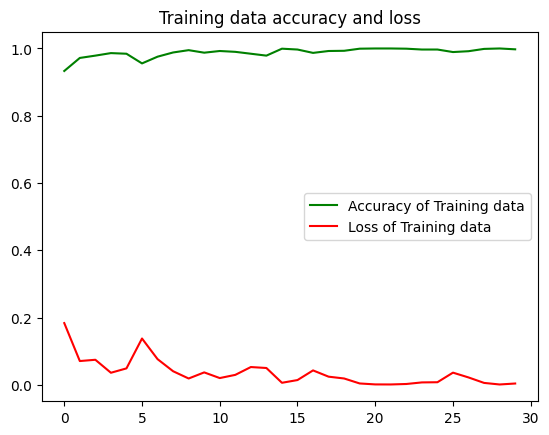

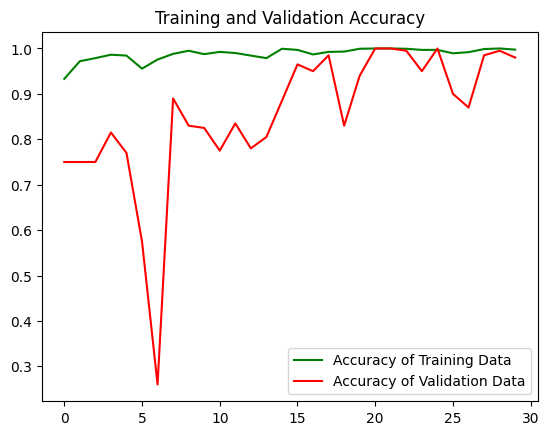

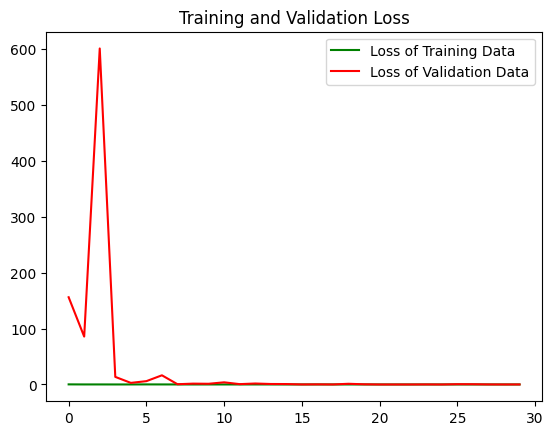

<Figure size 640x480 with 0 Axes>

In [ ]:

epochs = range(len(get_ac5))

# Plot accuracy and loss of training data
plt.plot(epochs, get_ac5, 'g', label='Accuracy of Training Data')
plt.plot(epochs, get_los5, 'r', label='Loss of Training Data')
plt.title('Training Data Accuracy and Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training accuracy and validation accuracy
plt.plot(epochs, get_ac5, 'g', label='Accuracy of Training Data')
plt.plot(epochs, val_acc5, 'r', label='Accuracy of Validation Data')
plt.title('Training and Validation Accuracy')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Accuracy')

plt.show()

# Create a new figure for the next plot
plt.figure()

# Plot training loss and validation loss
plt.plot(epochs, get_los5, 'g', label='Loss of Training Data')
plt.plot(epochs, val_loss5, 'r', label='Loss of Validation Data')
plt.title('Training and Validation Loss')
plt.legend(loc=0)

# Set x-axis and y-axis labels
plt.xlabel('Epochs')
plt.ylabel('Loss')

plt.show()

In [ ]:
loss5, accuracy5 = model.evaluate(test_ds)
print(loss5,accuracy5)

4/4 [==============================] - 0s 64ms/step - loss: 0.1027 - accuracy: 0.9700
0.10270647704601288 0.9700000286102295


<ipython-input-59-f3d5ad097424>:4: MatplotlibDeprecationWarning: Auto-removal of overlapping axes is deprecated since 3.6 and will be removed two minor releases later; explicitly call ax.remove() as needed.
  ax = plt.subplot(4, 4, i + 1)


1/1 [==============================] - 0s 35ms/step


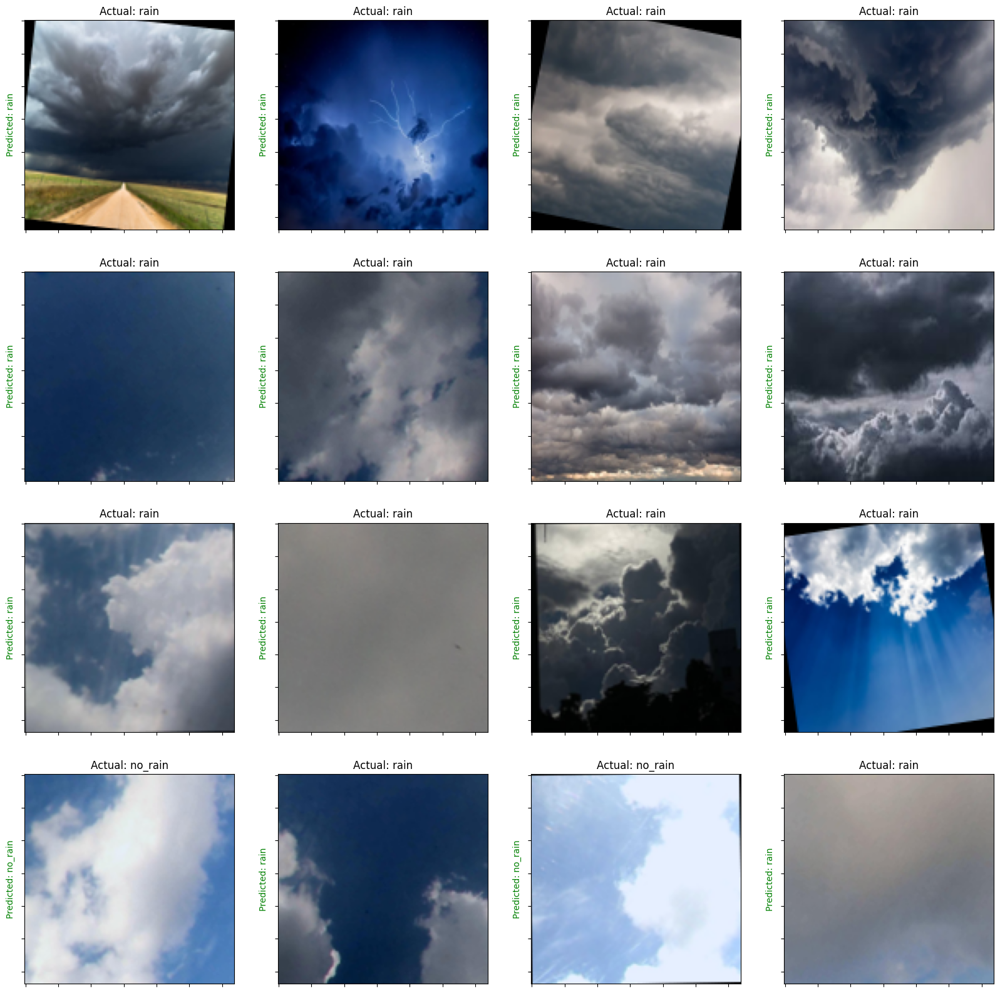

In [ ]:
plt.subplots(figsize=(20, 20))
for images, labels in test_ds.take(1):
    for i in range(16):
        ax = plt.subplot(4, 4, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        predictions = model.predict(tf.expand_dims(images[i], 0))
        score = tf.nn.softmax(predictions[0])
        if(class_names[labels[i]]==class_names[np.argmax(score)]):
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'green'})

        else:
            plt.title("Actual: "+class_names[labels[i]])
            plt.ylabel("Predicted: "+class_names[np.argmax(score)],fontdict={'color':'red'})
        plt.gca().axes.yaxis.set_ticklabels([])
        plt.gca().axes.xaxis.set_ticklabels([])

In [ ]:
for img, label in test_ds.take(1):
    print(label, len(label))
    break

tf.Tensor(
[1 1 0 1 1 1 1 0 1 1 0 1 0 0 0 0 1 0 1 0 1 1 0 1 1 0 1 1 0 1 1 1 0 1 1 1 1
 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 0 1], shape=(64,), dtype=int32) 64


In [ ]:
actual_label = []
pred_label = []
for img, label in test_ds.take(1):
    pred = model.predict(img)
    pred = np.argmax(pred, axis=1)
    print(classification_report(label,pred))

2/2 [==============================] - 2s 21ms/step
              precision    recall  f1-score   support

           0       1.00      0.92      0.96        13
           1       0.98      1.00      0.99        51

    accuracy                           0.98        64
   macro avg       0.99      0.96      0.98        64
weighted avg       0.98      0.98      0.98        64



***Comparing accuracy***

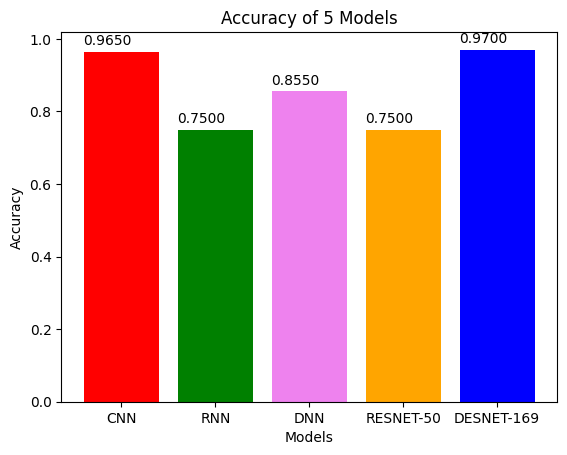

In [ ]:
import matplotlib.pyplot as plt

accuracy_values = [accuracy1, accuracy2, accuracy3, accuracy4, accuracy5]
colors = ['red', 'green' ,'violet','orange', 'blue']

# Convert accuracy 5 to an integer
accuracy_values[-1] = float(accuracy_values[-1])

bar_chart = plt.bar(['CNN', 'RNN', 'DNN', 'RESNET-50', 'DESNET-169'], accuracy_values, color=colors)

for bar in bar_chart:
    y = bar.get_height()
    plt.text(bar.get_x() + 0.25, y + 0.01, f"{y:.4f}", ha='center', va='bottom')

plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Accuracy of 5 Models')
plt.show()
